<a href="https://colab.research.google.com/github/Shivampandya2/inse6220_project/blob/main/PCA_with_WiFi_Localization_data_with_pycaret.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Multiclass Classification with PyCaret**

Multiclass classification is a supervised machine learning technique where the goal is to classify instances into one of three or more classes. (Classifying instances into one of two classes is called Binary Classification).

**Install Pycaret**

In [ ]:
# install slim version (default): if you get an error message, run it again
!pip install pycaret pyspc 

**Import Libraries**

In [196]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
#plt.rcParams['figure.figsize'] = (15,10)
import statsmodels.api as sm

from statsmodels.formula.api import ols
from sklearn.decomposition import PCA
from scipy.stats import beta
from scipy.stats import f
from sklearn.preprocessing import StandardScaler
#from pyspc import spc, xbar_rbar, rbar, rules
#from statsmodels.graphics.factorplots import interaction_plot


**Dataset**

Here, the dataset contain 7 Wifi Strengh Signals from routers in 4 different Rooms. The data set can be used for the tasks of classification and cluster analysis.

Attribute Information:
WS# stands for Wifi Signal from # router.  

1. WS1,
2. WS2,
3. WS3,
4. WS4,
5. WS5,
6. WS6,
7. WS7,
8. class: 1(room1),  2(room2), 3(room3), 4(room4)

All of these parameters were real-valued continuous.

https://archive.ics.uci.edu/ml/datasets/Wireless+Indoor+Localization


In [136]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/Shivampandya2/inse6220_project/main/wifi_localization.csv')
df.head(25)

,WS1,WS2,WS3,WS4,WS5,WS6,WS7,class
0,-64,-56,-61,-66,-71,-82,-81,1
1,-68,-57,-61,-65,-71,-85,-85,1
2,-63,-60,-60,-67,-76,-85,-84,1
3,-61,-60,-68,-62,-77,-90,-80,1
4,-63,-65,-60,-63,-77,-81,-87,1
5,-64,-55,-63,-66,-76,-88,-83,1
6,-65,-61,-65,-67,-69,-87,-84,1
7,-61,-63,-58,-66,-74,-87,-82,1
8,-65,-60,-59,-63,-76,-86,-82,1
9,-62,-60,-66,-68,-80,-86,-91,1


In [137]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   WS1     2000 non-null   int64
 1   WS2     2000 non-null   int64
 2   WS3     2000 non-null   int64
 3   WS4     2000 non-null   int64
 4   WS5     2000 non-null   int64
 5   WS6     2000 non-null   int64
 6   WS7     2000 non-null   int64
 7   class   2000 non-null   int64
dtypes: int64(8)
memory usage: 125.1 KB


In [80]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [81]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

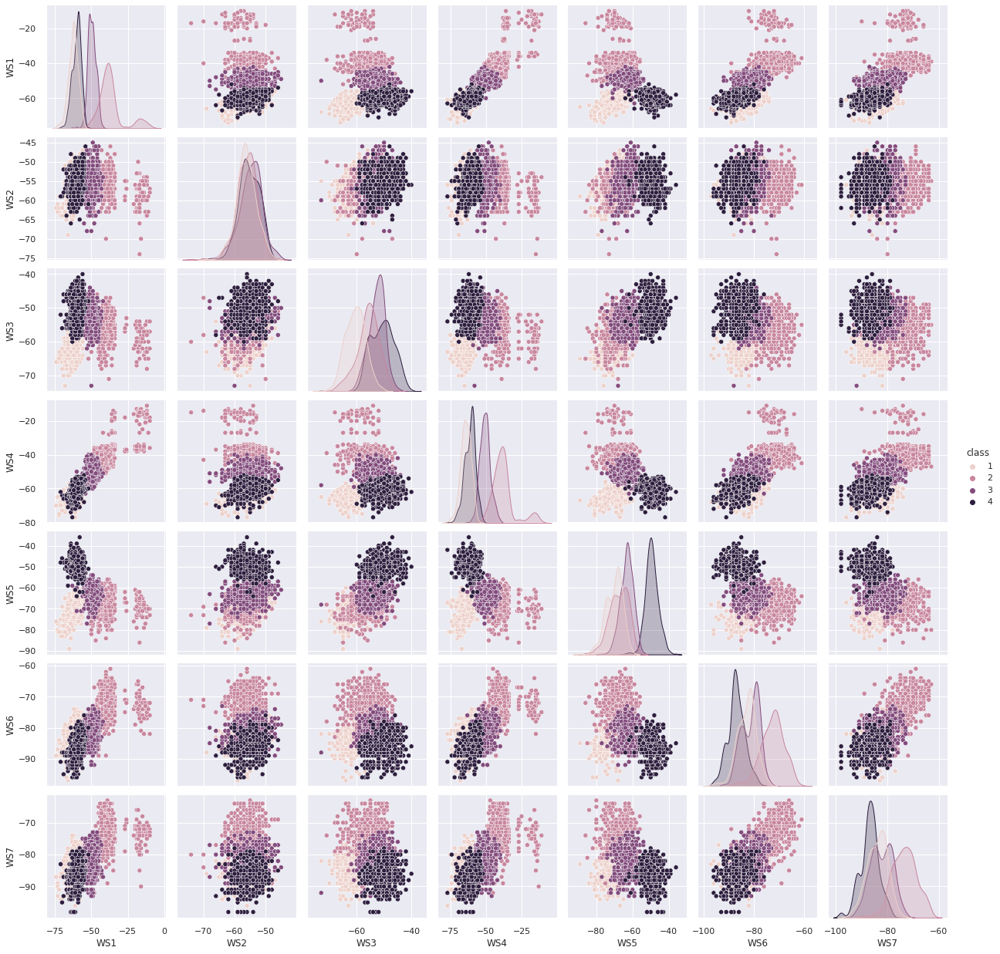

In [82]:
sns.pairplot(df, hue='class')
plt.show()

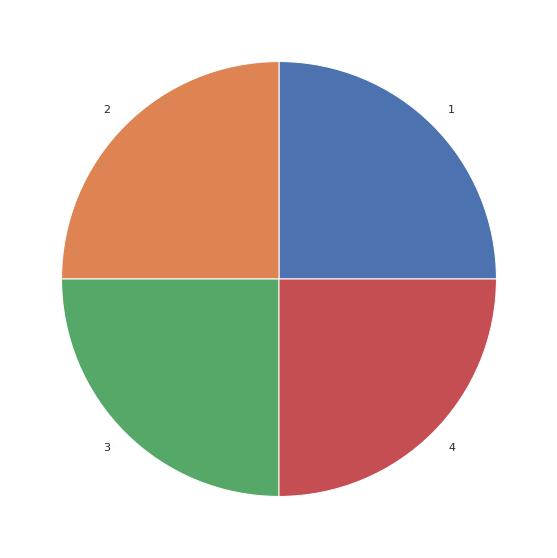

In [138]:
y =df['class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [139]:
X = df.drop(columns=['class'])
X.head(10)

,WS1,WS2,WS3,WS4,WS5,WS6,WS7
0,-64,-56,-61,-66,-71,-82,-81
1,-68,-57,-61,-65,-71,-85,-85
2,-63,-60,-60,-67,-76,-85,-84
3,-61,-60,-68,-62,-77,-90,-80
4,-63,-65,-60,-63,-77,-81,-87
5,-64,-55,-63,-66,-76,-88,-83
6,-65,-61,-65,-67,-69,-87,-84
7,-61,-63,-58,-66,-74,-87,-82
8,-65,-60,-59,-63,-76,-86,-82
9,-62,-60,-66,-68,-80,-86,-91


In [140]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
WS1,2000.0,-52.3305,11.321677,-74.0,-61.0,-55.0,-46.0,-10.0
WS2,2000.0,-55.6235,3.417688,-74.0,-58.0,-56.0,-53.0,-45.0
WS3,2000.0,-54.9640,5.316186,-73.0,-58.0,-55.0,-51.0,-40.0
WS4,2000.0,-53.5665,11.471982,-77.0,-63.0,-56.0,-46.0,-11.0
WS5,2000.0,-62.6405,9.105093,-89.0,-69.0,-64.0,-56.0,-36.0
WS6,2000.0,-80.9850,6.516672,-97.0,-86.0,-82.0,-77.0,-61.0
WS7,2000.0,-81.7265,6.519812,-98.0,-87.0,-83.0,-78.0,-63.0


**Standardize the Data**

In [141]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,WS1,WS2,WS3,WS4,WS5,WS6,WS7
0,-1.030980,-0.110190,-1.135684,-1.084085,-0.918342,-0.155793,0.111457
1,-1.384373,-0.402858,-1.135684,-0.996895,-0.918342,-0.616266,-0.502211
2,-0.942631,-1.280864,-0.947533,-1.171276,-1.467623,-0.616266,-0.348794
3,-0.765935,-1.280864,-2.452747,-0.735323,-1.577479,-1.383721,0.264874
4,-0.942631,-2.744208,-0.947533,-0.822513,-1.577479,-0.002302,-0.809045
5,-1.030980,0.182479,-1.511988,-1.084085,-1.467623,-1.076739,-0.195377
6,-1.119328,-1.573533,-1.888292,-1.171276,-0.698630,-0.923248,-0.348794
7,-0.765935,-2.158871,-0.571229,-1.084085,-1.247911,-0.923248,-0.041960
8,-1.119328,-1.280864,-0.759381,-0.822513,-1.467623,-0.769757,-0.041960
9,-0.854283,-1.280864,-2.076443,-1.258467,-1.907047,-0.769757,-1.422713


In [142]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
WS1,2000.0,6.396550e-16,1.00025,-1.914462,-0.765935,-0.235846,0.559288,3.739825
WS2,2000.0,2.132738e-16,1.00025,-5.378226,-0.695527,-0.110190,0.767816,3.109166
WS3,2000.0,-4.054979e-15,1.00025,-3.393506,-0.571229,-0.006773,0.745834,2.815504
WS4,2000.0,-3.406719e-16,1.00025,-2.043183,-0.822513,-0.212179,0.659728,3.711403
WS5,2000.0,-7.797651e-15,1.00025,-2.895752,-0.698630,-0.149349,0.729500,2.926622
WS6,2000.0,-3.047673e-15,1.00025,-2.458158,-0.769757,-0.155793,0.611661,3.067517
WS7,2000.0,1.328937e-15,1.00025,-2.496632,-0.809045,-0.195377,0.571708,2.872964


**Observations and variables**

In [143]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

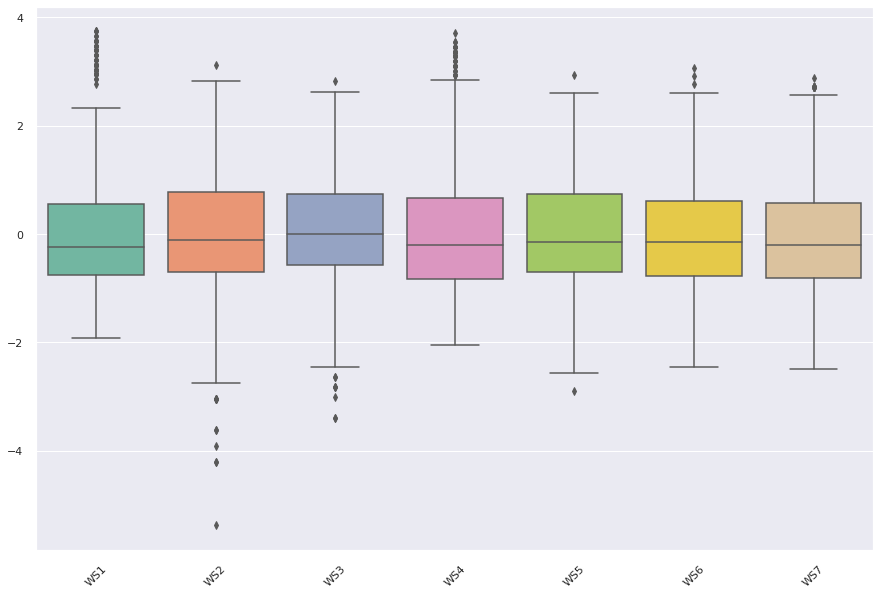

In [144]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

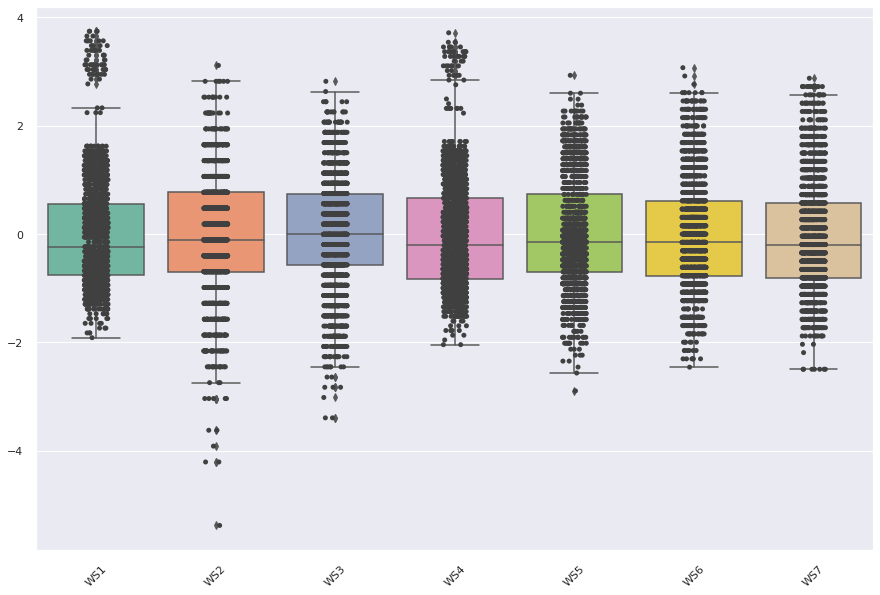

In [145]:
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

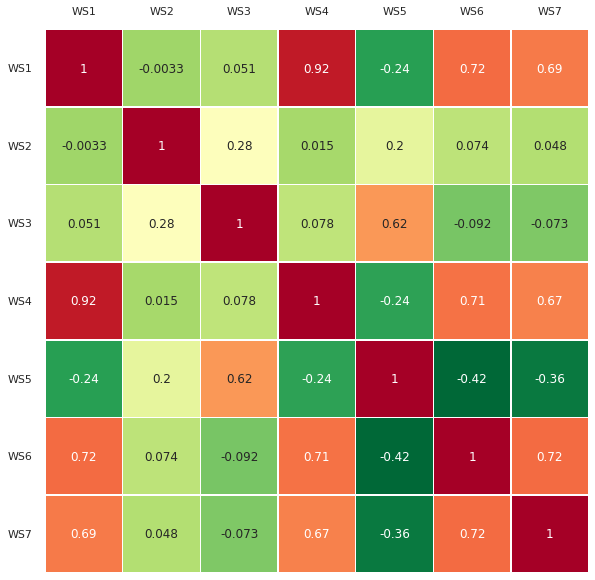

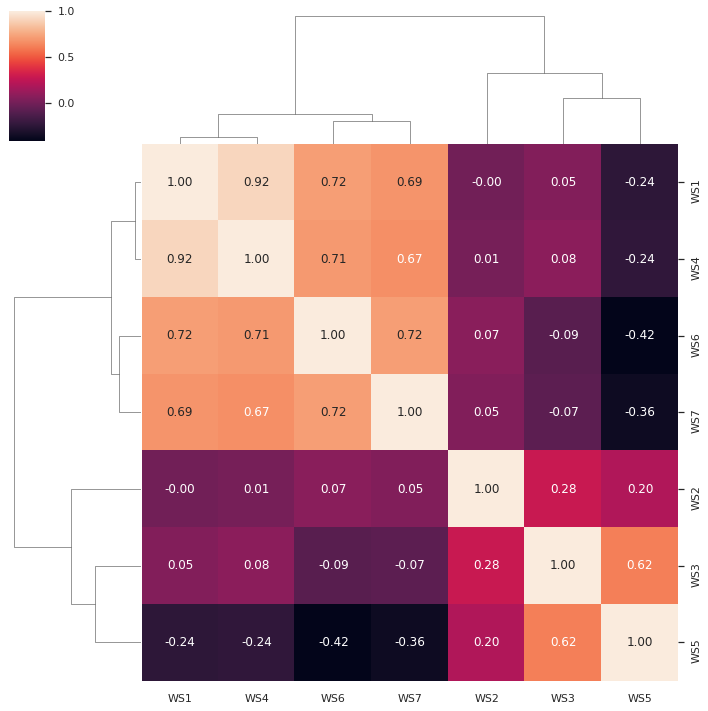

In [146]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
sns.clustermap(X.corr(), annot=True, fmt='.2f')

##**Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

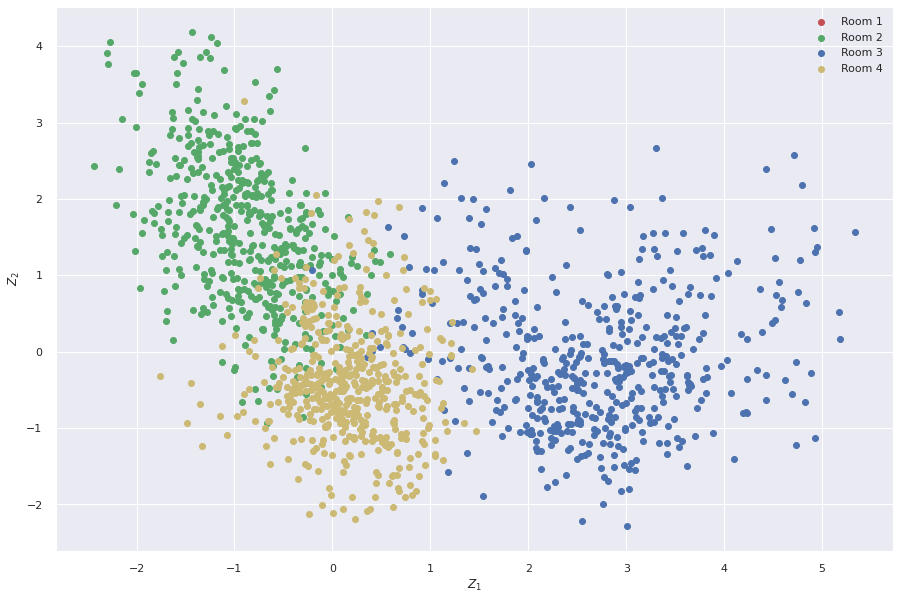

In [147]:
pca = PCA()
Z = pca.fit_transform(X)

# 1(room1)->0,  2(room2)->1, 3(room3)->2, 4(room4)->3
idx_room1 = np.where(y == 0)
idx_room2 = np.where(y == 1)
idx_room3 = np.where(y == 2)
idx_room4 = np.where(y == 3)

plt. figure()
plt.scatter(Z[idx_room1,0], Z[idx_room1,1], c='r', label='Room 1')
plt.scatter(Z[idx_room2,0], Z[idx_room2,1], c='g', label='Room 2')
plt.scatter(Z[idx_room3,0], Z[idx_room3,1], c='b', label='Room 3')
plt.scatter(Z[idx_room4,0], Z[idx_room4,1], c='y', label='Room 4')
plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

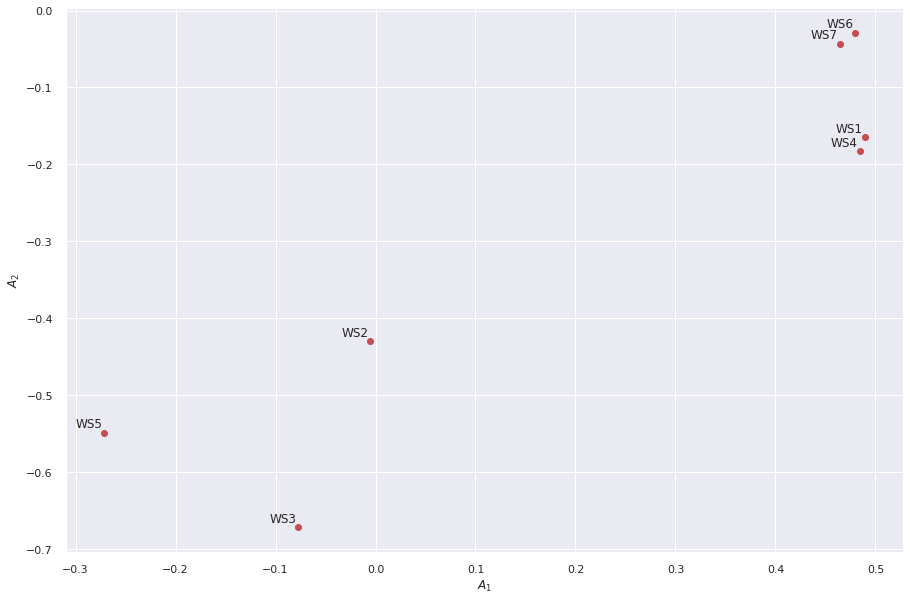

In [148]:
A = pca.components_.T 

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

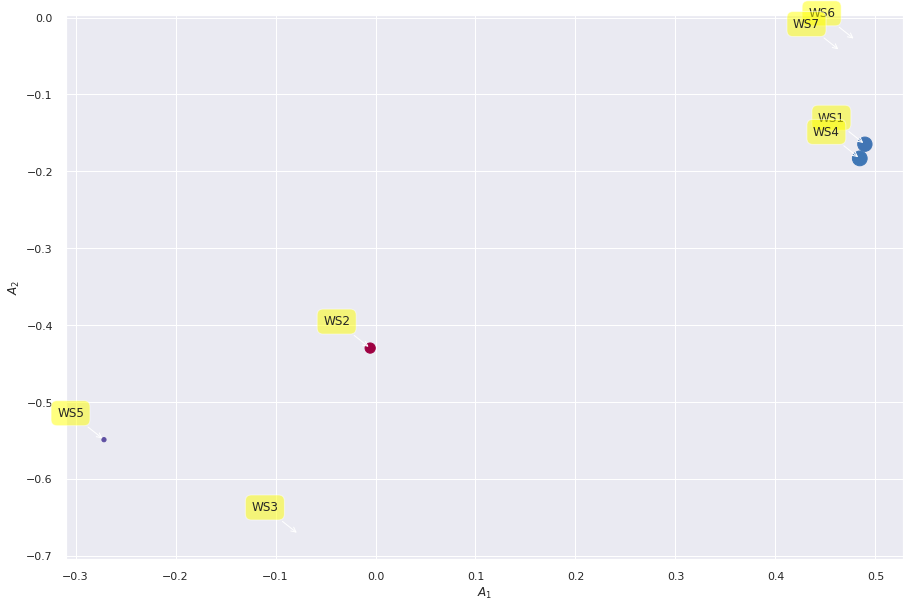

In [149]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

[3.39723854 1.71261245 0.87175678 0.37125232 0.31609168 0.25649215
 0.07805784]


Text(0, 0.5, 'Explained variance')

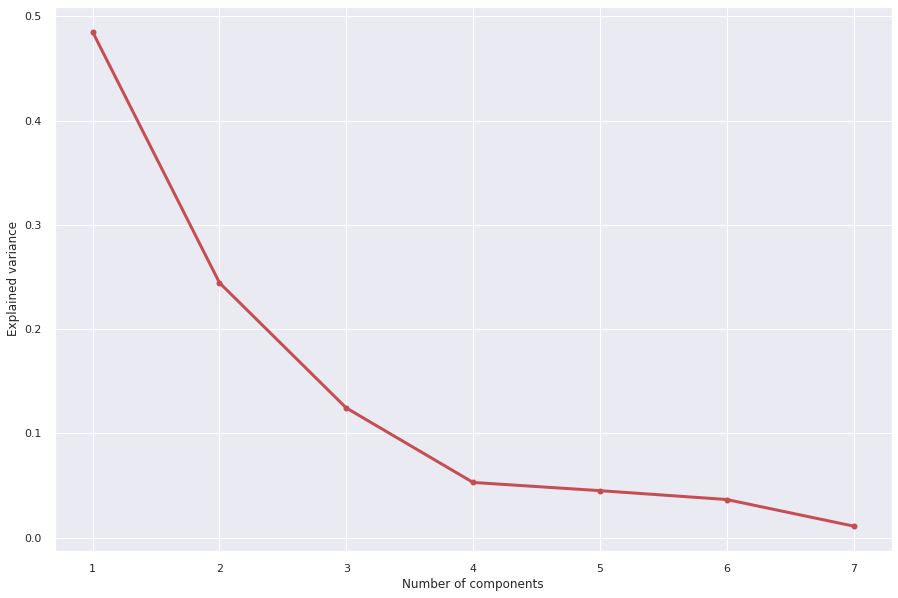

In [150]:
#Eigenvalues
Lambda = pca.explained_variance_ 
print(Lambda)

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

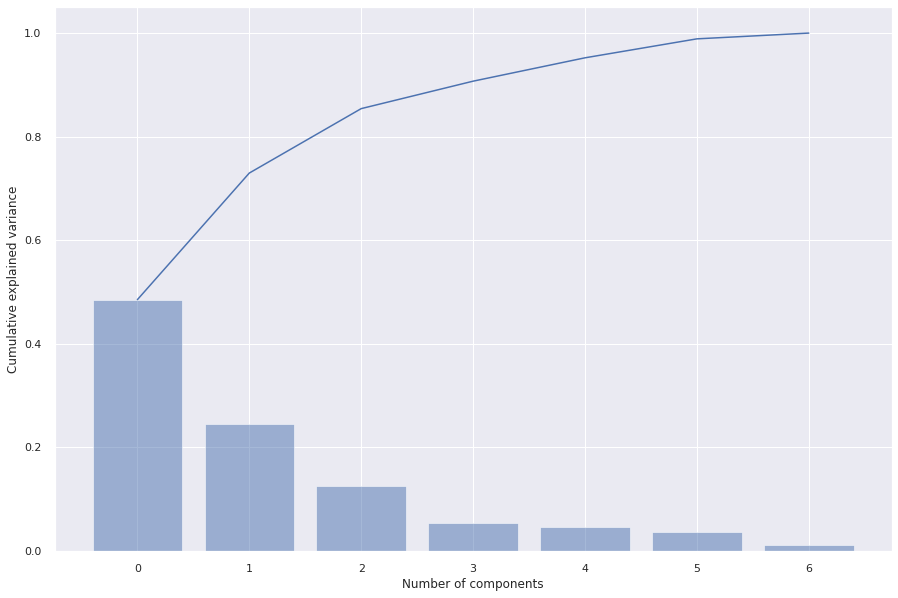

In [151]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Explained Variance per PC**


In [152]:
PC_variance = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)}
PC_variance

{'0': 'PC 1 (48.5%)',
 '1': 'PC 2 (24.5%)',
 '2': 'PC 3 (12.4%)',
 '3': 'PC 4 (5.3%)',
 '4': 'PC 5 (4.5%)',
 '5': 'PC 6 (3.7%)',
 '6': 'PC 7 (1.1%)'}

**Biplot**

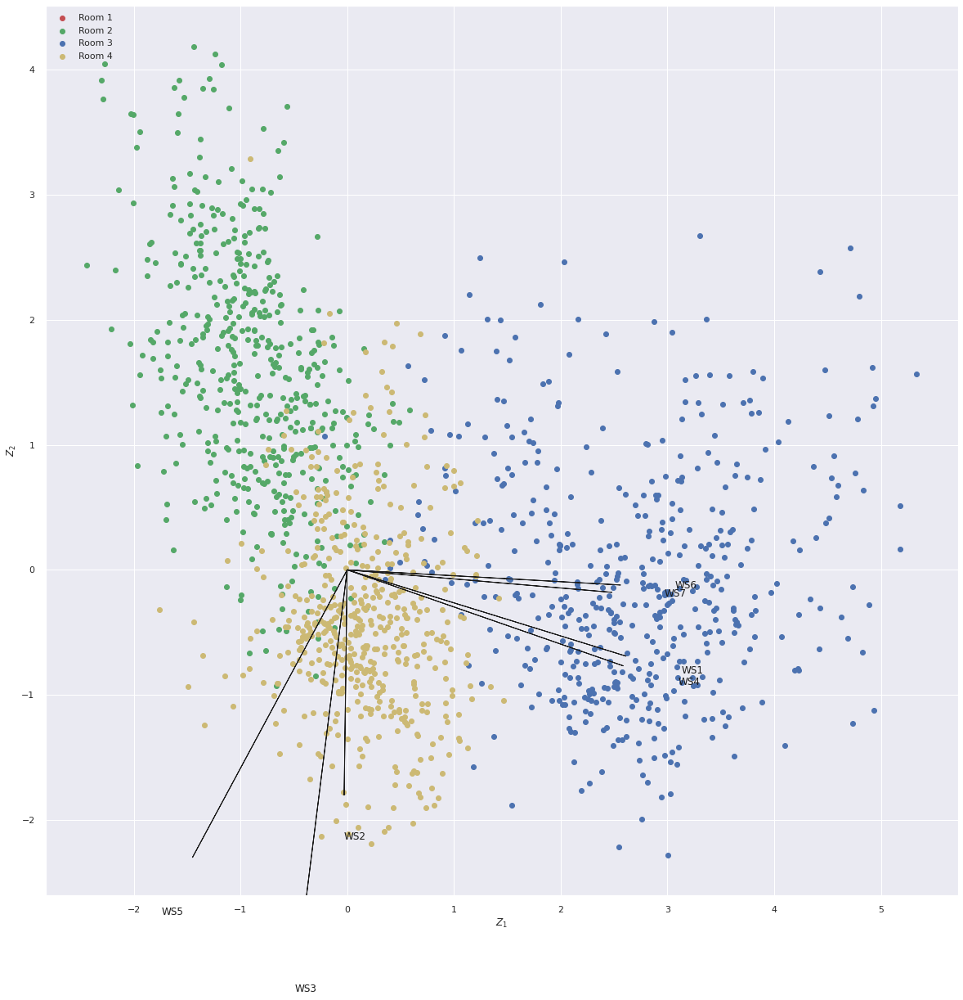

In [161]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure(figsize=(20,20))
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_room1,0], Z[idx_room1,1], c='r', label='Room 1')
plt.scatter(Z[idx_room2,0], Z[idx_room2,1], c='g', label='Room 2')
plt.scatter(Z[idx_room3,0], Z[idx_room3,1], c='b', label='Room 3')
plt.scatter(Z[idx_room4,0], Z[idx_room4,1], c='y', label='Room 4')

plt.legend(loc='upper left')

##**Using PCA Library**

In [100]:
!pip install pca

In [101]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [5] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[5]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


**Principal Components**

In [103]:
## Print the top features. The results show that f1 is best, followed by f2 etc
print(out['topfeat'])

    PC feature   loading  type
0  PC1     WS1  0.489488  best
1  PC2     WS3 -0.671425  best
2  PC3     WS2 -0.873985  best
3  PC4     WS7 -0.649088  best
4  PC5     WS5  0.660291  best
5  PC1     WS4  0.484384  weak
6  PC1     WS6  0.479771  weak


**Scatter plot**

[pca] >Plot PC1 vs PC2 with loadings.


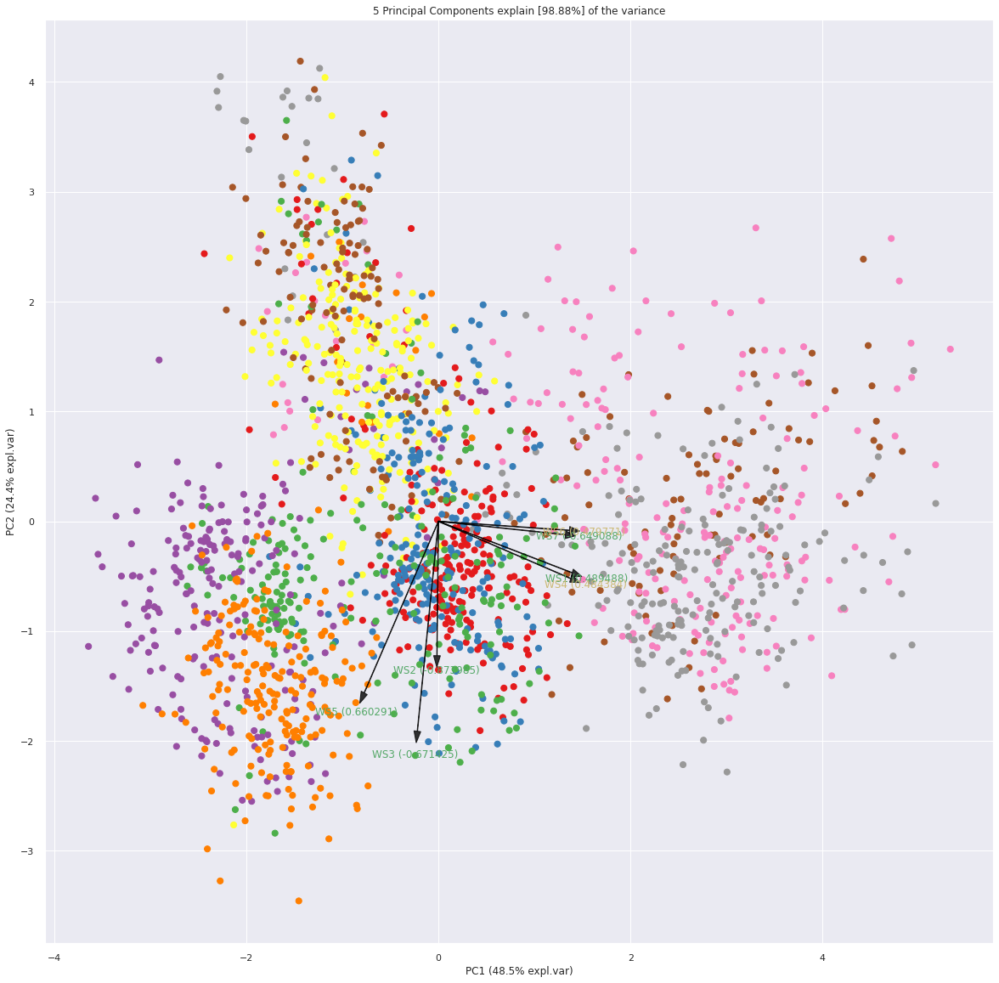

In [163]:
 ax = model.biplot(label=None, legend=False, color_arrow='black', figsize=(20,20))


[pca] >Plot PC1 vs PC2 with loadings.


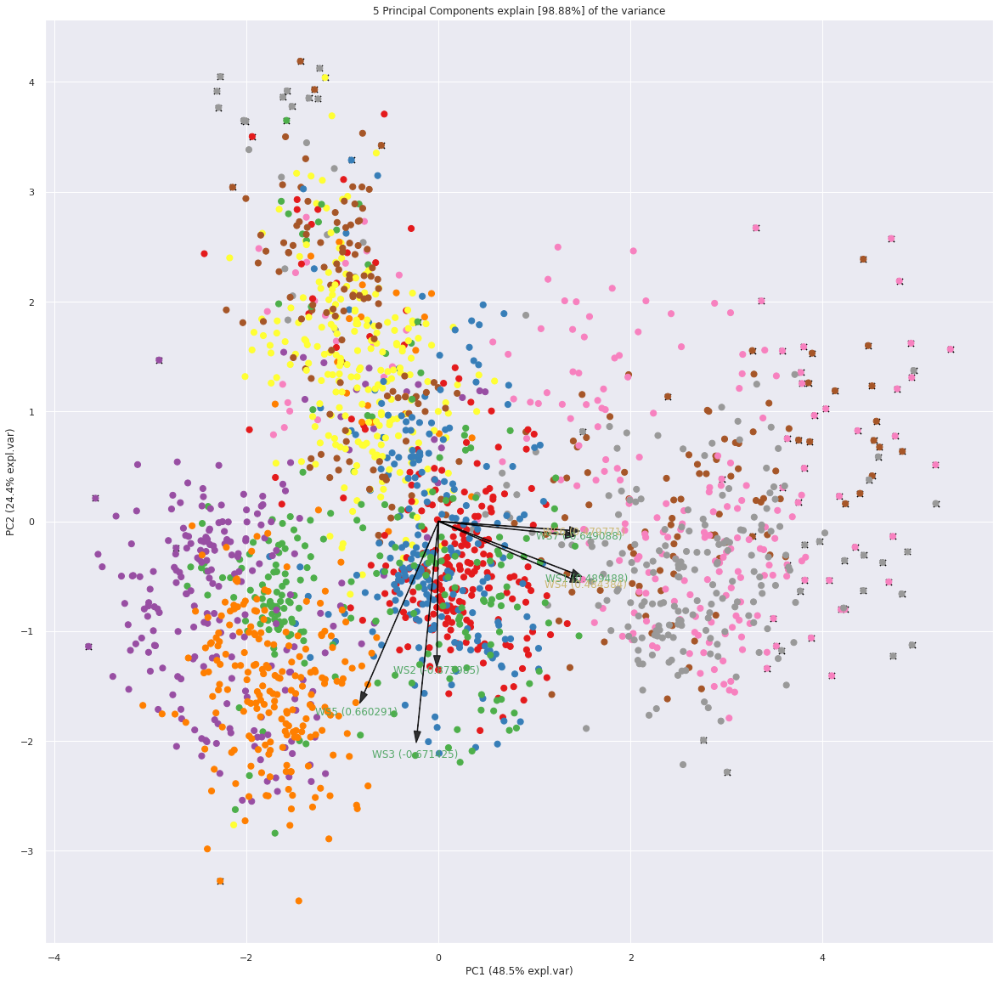

(<Figure size 1440x1440 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f878fadb7d0>)

In [209]:
model.biplot(label=None, legend=False, hotellingt2=True,color_arrow='black', figsize=(20,20))

[pca] >Plot PC1 vs PC2 with loadings.


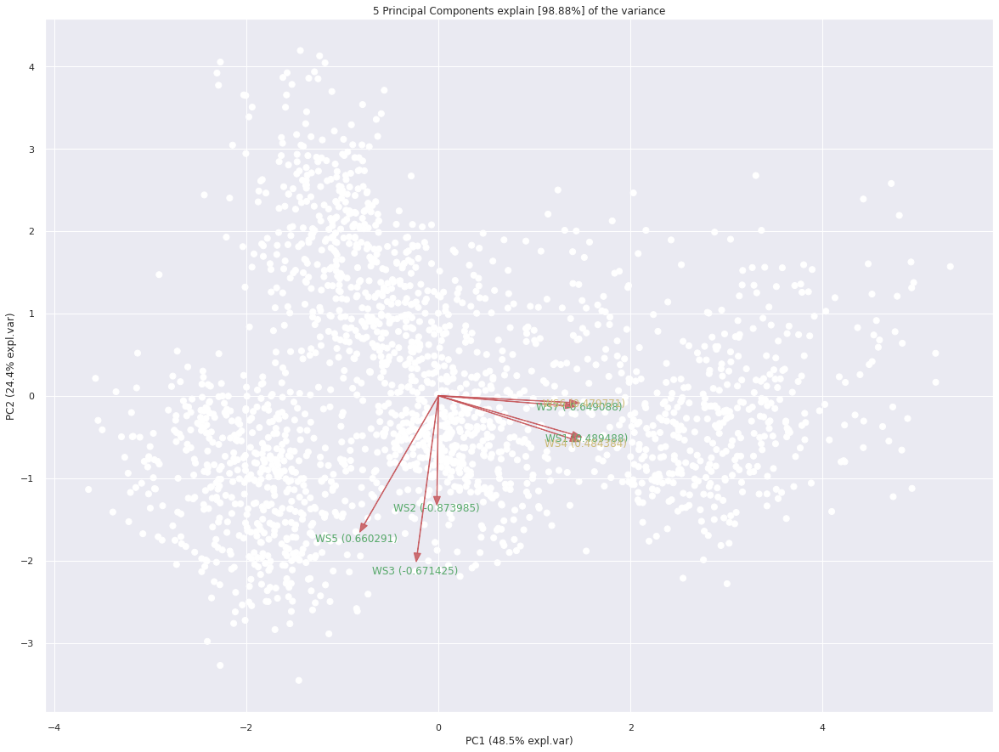

(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f87728e5f10>)

In [173]:
model.biplot(cmap=None, label=None, legend=False, figsize=(20,15))


**Eigenvectors**

In [175]:
A = out['loadings'].T
print(A)

          PC1       PC2       PC3       PC4       PC5
WS1  0.489488 -0.164690  0.197910  0.410572  0.041690
WS2 -0.005341 -0.429715 -0.873985  0.209005  0.038026
WS3 -0.077131 -0.671425  0.241294 -0.329434 -0.590524
WS4  0.484384 -0.183117  0.193121  0.434860 -0.015286
WS5 -0.271606 -0.548815  0.278587  0.035565  0.660291
WS6  0.479771 -0.028944 -0.131163 -0.259878 -0.164221
WS7  0.464592 -0.042931 -0.081539 -0.649088  0.430013


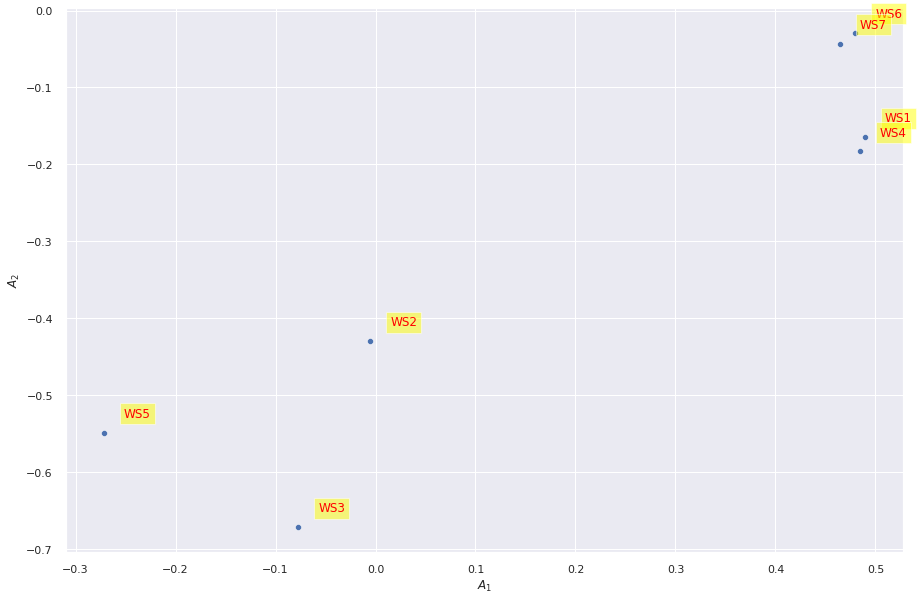

In [176]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=12),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

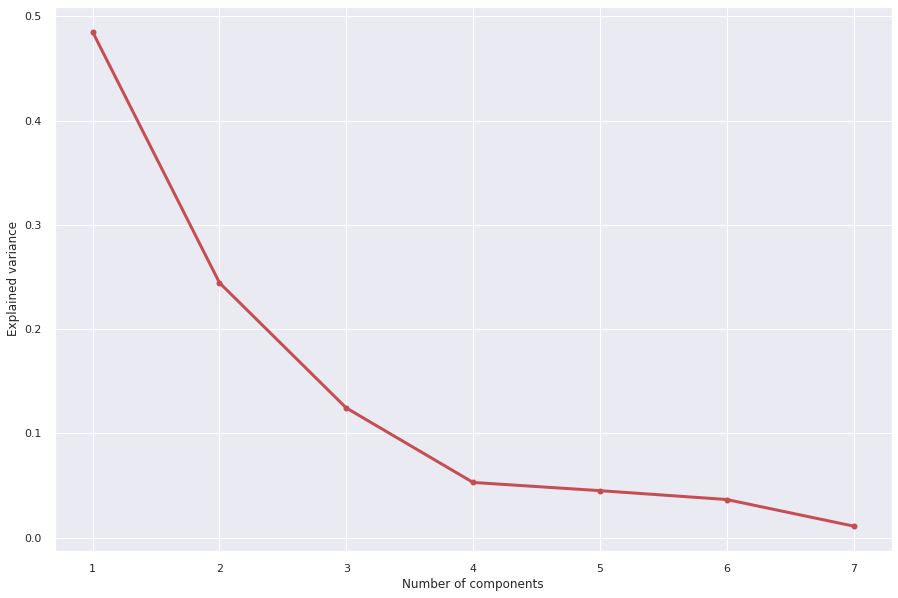

In [177]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

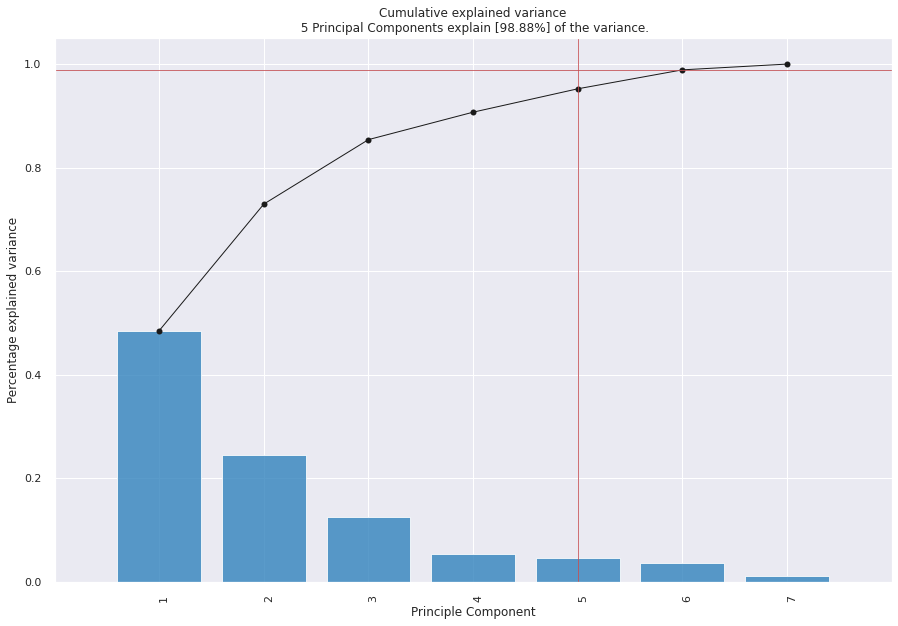

<Figure size 1080x720 with 0 Axes>

In [178]:
model.plot();

**Biplot**

[pca] >Plot PC1 vs PC2 with loadings.
[pca] >Set parameter "label=None" to ignore the labels and significanly speed up the scatter plot.


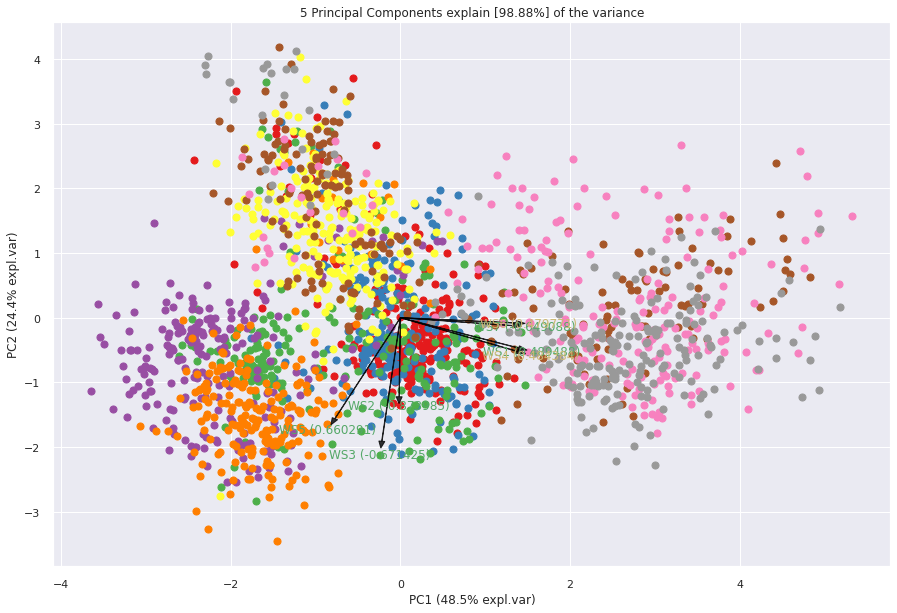

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f8782b7f410>)

In [128]:
model.biplot(label=False, legend=False, color_arrow='black')

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


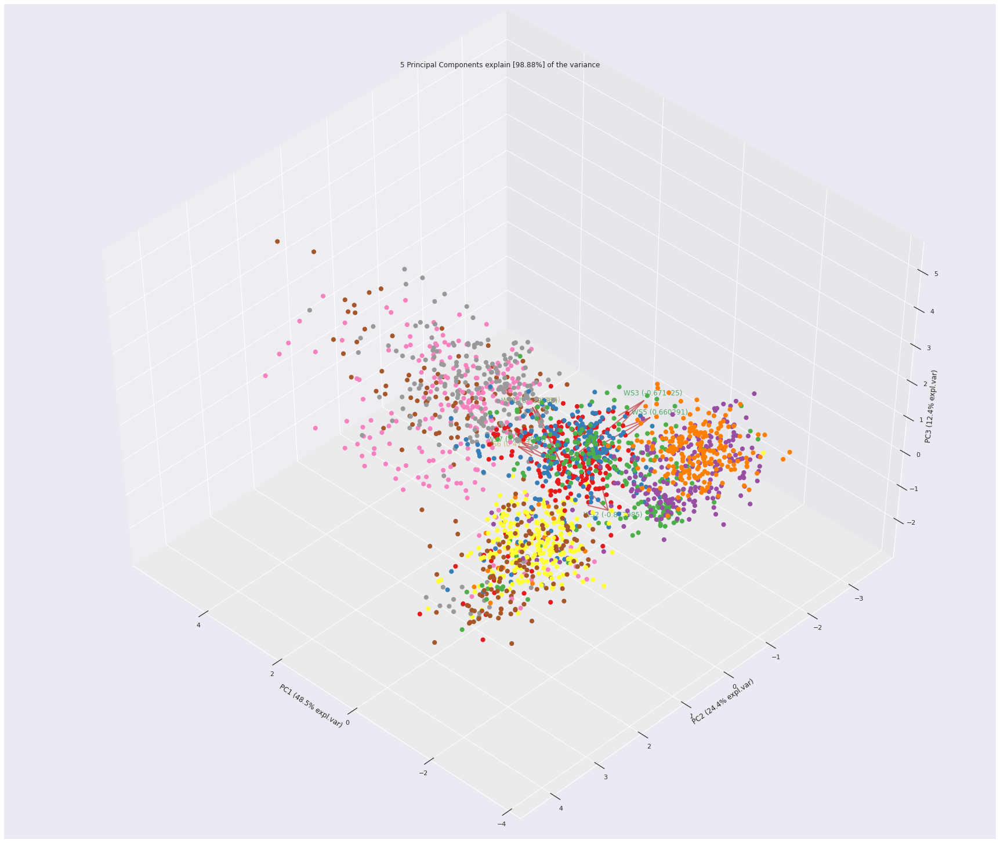

(<Figure size 1800x1440 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7f8771b1db10>)

In [194]:
model.biplot3d(label=None, legend=False, figsize=(25, 20),alpha_transparency=1 )

**Hotelling T2 Test**

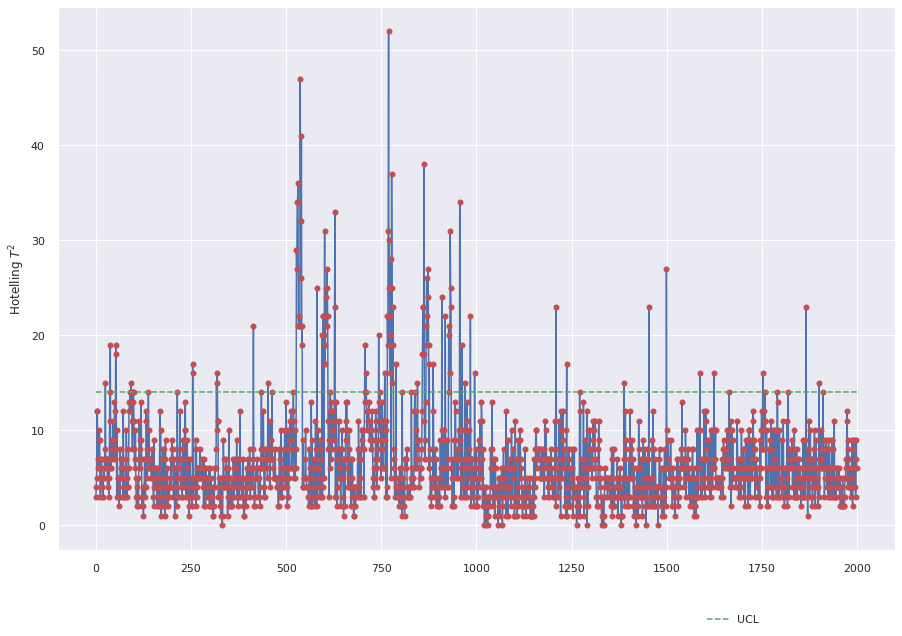

In [199]:
alpha = 0.05
p=Z.shape[1]
n=Z.shape[0]

UCL=((n-1)**2/n )*beta.ppf(1-alpha, p / 2 , (n-p-1)/ 2)
UCL2=p*(n+1)*(n-1)/(n*(n-p) )*f.ppf(1-alpha, p , n-p)
Tsquare=np.array([0]*Z.shape[0])
for i in range(Z.shape[0]):
  Tsquare[i] = np.matmul(np.matmul(np.transpose(Z[i]),np.diag(1/Lambda) ) , Z[i])

fig, ax = plt.subplots()
ax.plot(Tsquare,'-b', marker='o', mec='y',mfc='r' )
ax.plot([UCL for i in range(len(Z1))], "--g", label="UCL")
plt.ylabel('Hotelling $T^2$')
legend = ax.legend(shadow=False, ncol=4, bbox_to_anchor=(0.85, -0.1))

**Control Charts for Principal Components**


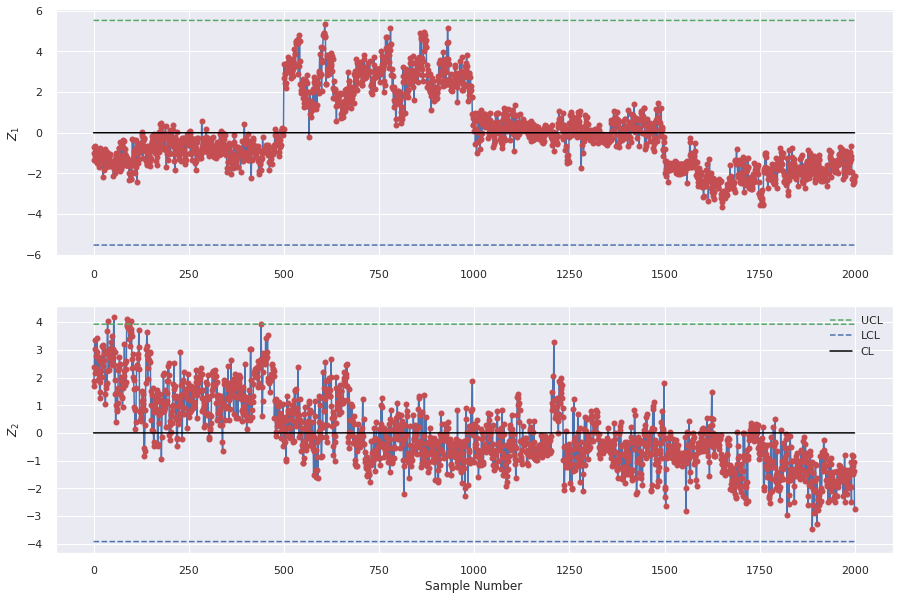

In [201]:
fig, (ax1, ax2) = plt.subplots(2,1)
ax1.plot(Z1,'-b', marker='o', mec='y',mfc='r')
ax1.plot([3*np.sqrt(Lambda[0]) for i in range(len(Z1))], "--g", label="UCL")
ax1.plot([-3*np.sqrt(Lambda[0]) for i in range(len(Z1))], "--b", label='LCL')
ax1.plot([0 for i in range(len(Z1))], "-", color='black',label='CL')
ax1.set_ylabel('$Z_1$')
legend = ax.legend(shadow=False, ncol=4, bbox_to_anchor=(0.85, -0.1))

ax2.plot(Z2,'-b', marker='o', mec='y',mfc='r')
ax2.plot([3*np.sqrt(Lambda[1]) for i in range(len(Z2))], "--g", label="UCL")
ax2.plot([-3*np.sqrt(Lambda[1]) for i in range(len(Z2))], "--b", label='LCL')
ax2.plot([0 for i in range(len(Z2))], "-", color='black',label='CL')
ax2.set_ylabel('$Z_2$')
ax2.set_xlabel('Sample Number')
legend = ax.legend(shadow=False, ncol=4, bbox_to_anchor=(0.85, -0.1))
plt.legend()

#**Classification**

**Using PyCaret**

In [ ]:
#Run the below code in your notebook to check the installed version
!pip install pycaret
from pycaret.utils import version
version()

:PyCaret uses interactive plotting ability. In order to render interactive plots in Google Colab, run the below line of code in your colab notebook.

In [204]:
#For Google Colab only
import pycaret
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In order to demonstrate the predict_model() function on unseen data, a sample of 21 observations has been withheld from the original dataset to be used for predictions. This should not be confused with a train/test split as this particular split is performed to simulate a real life scenario. Another way to think about this is that these 21 records were not available at the time when the machine learning experiment was performed.

In [205]:
data = df.sample(frac=0.9, random_state=901)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (1800, 8)
Unseen Data For Predictions: (200, 8)


**Setting up the Environment in PyCaret**

The setup() function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. setup() must be called before executing any other function in pycaret. It takes two mandatory parameters: a pandas dataframe and the name of the target column. All other parameters are optional and are used to customize the pre-processing pipeline (we will see them in later tutorials).

When setup() is executed, PyCaret's inference algorithm will automatically infer the data types for all features based on certain properties. The data type should be inferred correctly but this is not always the case. To account for this, PyCaret displays a table containing the features and their inferred data types after setup() is executed. If all of the data types are correctly identified enter can be pressed to continue or quit can be typed to end the expriment. Ensuring that the data types are correct is of fundamental importance in PyCaret as it automatically performs a few pre-processing tasks which are imperative to any machine learning experiment. These tasks are performed differently for each data type which means it is very important for them to be correctly configured.

In [206]:
from pycaret.classification import *
clf = setup(df, target='class', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,class
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(2000, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


Once the setup has been succesfully executed it prints the information grid which contains several important pieces of information. Most of the information is related to the pre-processing pipeline which is constructed when setup() is executed. The majority of these features are out of scope for the purposes of this tutorial however a few important things to note at this stage include:

* **session_id** : A pseduo-random number distributed as a seed in all functions for later reproducibility. If no session_id is passed, a random number is automatically generated that is distributed to all functions. In this experiment, the session_id is set as 123 for later reproducibility.

* **Target Type** : Binary or Multiclass. The Target type is automatically detected and shown. There is no difference in how the experiment is performed for Binary or Multiclass problems. All functionalities are identical.

* **Label Encoded** : When the Target variable is of type string (i.e. 'Yes' or 'No') instead of 1 or 0, it automatically encodes the label into 1 and 0 and displays the mapping (0 : No, 1 : Yes) for reference. 

* **Original Data** : Displays the original shape of the dataset. In this experiment (189, 8) means 189 samples and 8 features including the class column.

* **Missing Values** : When there are missing values in the original data this will show as True. For this experiment there are no missing values in the dataset.

* **Numeric Features** : The number of features inferred as numeric. In this dataset, 7 out of 8 features are inferred as numeric.

* **Categorical Features** : The number of features inferred as categorical. In this dataset, there are no categorical features.

* **Transformed Train Set** : Displays the shape of the transformed training set. Notice that the original shape of (189, 8) is transformed into (132, 7) for the transformed train set.

* **Transformed Test Set** : Displays the shape of the transformed test/hold-out set. There are 57 samples in test/hold-out set. This split is based on the default value of 70/30 that can be changed using the train_size parameter in setup.

Notice how a few tasks that are imperative to perform modeling are automatically handled such as missing value imputation, categorical encoding etc. Most of the parameters in setup() are optional and used for customizing the pre-processing pipeline. 

**Comparing All Models**

In [208]:
 #show the best model and their statistics
 best_model = compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.9836,0.9975,0.9835,0.9842,0.9836,0.9781,0.9783,0.117
et,Extra Trees Classifier,0.9836,0.9996,0.9834,0.9841,0.9836,0.9781,0.9782,0.463
lightgbm,Light Gradient Boosting Machine,0.9828,0.9994,0.9828,0.9836,0.9828,0.9771,0.9774,0.232
nb,Naive Bayes,0.9821,0.9989,0.9820,0.9827,0.9822,0.9762,0.9763,0.016
rf,Random Forest Classifier,0.9814,0.9993,0.9813,0.9820,0.9814,0.9752,0.9754,0.510
qda,Quadratic Discriminant Analysis,0.9793,0.9986,0.9791,0.9797,0.9793,0.9724,0.9725,0.016
gbc,Gradient Boosting Classifier,0.9786,0.9992,0.9785,0.9796,0.9786,0.9714,0.9717,0.666
lr,Logistic Regression,0.9757,0.9990,0.9757,0.9764,0.9758,0.9676,0.9678,0.877
dt,Decision Tree Classifier,0.9707,0.9805,0.9705,0.9716,0.9707,0.9609,0.9612,0.017
lda,Linear Discriminant Analysis,0.9678,0.9981,0.9677,0.9710,0.9681,0.9571,0.9581,0.015


In [210]:
best_model

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

**Create a Model**

create_model is the most granular function in PyCaret and is often the foundation behind most of the PyCaret functionalities. As the name suggests this function trains and evaluates a model using cross validation that can be set with fold parameter. The output prints a score grid that shows Accuracy, Recall, Precision, F1, Kappa and MCC by fold.

For the remaining part of this tutorial, we will work with the below models as our candidate models. The selections are for illustration purposes only and do not necessarily mean they are the top performing or ideal for this type of data.

* Decision Tree Classifier ('dt')
* K Neighbors Classifier ('knn')
* Logistic Regression ('lr')

There are many classifiers available in the model library of PyCaret. Please view the create_model() docstring for the list of all available models.

**Create Decision Tree Classifier**

In [211]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9643,0.9762,0.9634,0.9659,0.9642,0.9524,0.9529
1,0.9643,0.9763,0.9643,0.9662,0.9639,0.9524,0.9532
2,0.9786,0.9857,0.9786,0.9803,0.9785,0.9714,0.9720
3,0.9714,0.9810,0.9714,0.9722,0.9714,0.9619,0.9622
4,0.9786,0.9857,0.9786,0.9786,0.9785,0.9714,0.9715
5,0.9714,0.9810,0.9714,0.9718,0.9714,0.9619,0.9620
6,0.9929,0.9953,0.9929,0.9931,0.9929,0.9905,0.9905
7,0.9643,0.9763,0.9641,0.9653,0.9646,0.9524,0.9525
8,0.9571,0.9716,0.9567,0.9583,0.9570,0.9429,0.9433


In [212]:
#trained model object is stored in the variable 'dt'. 
dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

**Tune a Model:** How to automatically tune the hyper-parameters of a multiclass model. When a model is created using the create_model() function it uses the default hyperparameters. In order to tune hyperparameters, the tune_model() function is used. The tune_model() function is a random grid search of hyperparameters over a pre-defined search space. By default, it is set to optimize Accuracy but this can be changed using optimize parameter. This function automatically tunes the hyperparameters of a model on a pre-defined search space and scores it using stratified cross validation. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1 and Kappa by fold.

**Tune Decision Tree Model**

In [213]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9571,0.9988,0.9565,0.9575,0.9571,0.9428,0.9430
1,0.9714,0.9881,0.9712,0.9718,0.9714,0.9619,0.9620
2,0.9929,0.9952,0.9929,0.9931,0.9929,0.9905,0.9905
3,0.9714,0.9903,0.9714,0.9718,0.9715,0.9619,0.9620
4,0.9714,0.9956,0.9714,0.9714,0.9713,0.9619,0.9620
5,0.9786,0.9968,0.9786,0.9788,0.9786,0.9714,0.9715
6,0.9786,0.9959,0.9786,0.9803,0.9785,0.9714,0.9720
7,0.9571,0.9802,0.9575,0.9587,0.9572,0.9429,0.9433
8,0.9714,0.9880,0.9712,0.9722,0.9714,0.9619,0.9622


In [214]:
#tuned model object is stored in the variable 'tuned_dt'. 
tuned_dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

**Evaluate Decision Tree Model**

Update statmodels

In [ ]:
!pip install statsmodels --upgrade

How to analyze model performance using various plots

In [216]:
evaluate_model(tuned_dt)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create K Neighbors Model**

In [217]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9929,1.0000,0.9926,0.9931,0.9929,0.9905,0.9905
1,0.9571,0.9943,0.9569,0.9584,0.9569,0.9428,0.9434
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9929,0.9951,0.9929,0.9931,0.9929,0.9905,0.9905
5,0.9857,1.0000,0.9857,0.9865,0.9858,0.9810,0.9812
6,0.9786,0.9958,0.9782,0.9785,0.9785,0.9714,0.9715
7,0.9786,0.9950,0.9788,0.9803,0.9789,0.9714,0.9718
8,0.9714,0.9995,0.9712,0.9728,0.9714,0.9619,0.9624


**Tune K Neighbors Model**

In [218]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9786,0.9950,0.9786,0.9792,0.9786,0.9714,0.9716
1,0.9714,0.9866,0.9714,0.9733,0.9714,0.9619,0.9625
2,0.9857,0.9999,0.9857,0.9859,0.9857,0.9810,0.9810
3,0.9714,0.9997,0.9714,0.9744,0.9713,0.9619,0.9630
4,0.9786,0.9950,0.9786,0.9788,0.9785,0.9714,0.9716
5,0.9929,0.9964,0.9929,0.9931,0.9929,0.9905,0.9905
6,0.9714,0.9916,0.9708,0.9716,0.9712,0.9619,0.9621
7,0.9714,0.9904,0.9714,0.9726,0.9717,0.9619,0.9621
8,0.9857,0.9950,0.9855,0.9857,0.9857,0.9809,0.9809


**Evaluate K Neighbors Model**

In [219]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Logistic Regression Model**

In [220]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,0.9429,0.9975,0.9430,0.9452,0.9434,0.9238,0.9243
2,0.9857,0.9997,0.9857,0.9857,0.9857,0.9810,0.9810
3,0.9714,0.9993,0.9714,0.9720,0.9714,0.9619,0.9621
4,0.9857,0.9995,0.9857,0.9861,0.9856,0.9810,0.9812
5,0.9857,0.9997,0.9857,0.9865,0.9858,0.9810,0.9812
6,0.9714,0.9980,0.9714,0.9720,0.9714,0.9619,0.9621
7,0.9571,0.9976,0.9567,0.9575,0.9572,0.9428,0.9429
8,0.9714,0.9984,0.9712,0.9728,0.9714,0.9619,0.9624


**Tune Logistic Regression Model**

In [221]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9929,1.0000,0.9926,0.9931,0.9929,0.9905,0.9905
1,0.9500,0.9985,0.9498,0.9521,0.9496,0.9333,0.9343
2,0.9857,0.9999,0.9857,0.9857,0.9857,0.9810,0.9810
3,0.9857,0.9995,0.9857,0.9857,0.9857,0.9810,0.9810
4,0.9857,0.9996,0.9857,0.9861,0.9856,0.9810,0.9812
5,0.9857,0.9995,0.9857,0.9865,0.9858,0.9810,0.9812
6,0.9786,0.9992,0.9784,0.9792,0.9786,0.9714,0.9716
7,0.9786,0.9984,0.9788,0.9803,0.9789,0.9714,0.9718
8,0.9714,0.9983,0.9712,0.9728,0.9714,0.9619,0.9624


**Evaluate Logistic Regression Model**

In [222]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Random Forest Model**

In [223]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9857,0.9999,0.9853,0.9865,0.9857,0.9809,0.9812
1,0.9571,0.9987,0.9569,0.9579,0.9568,0.9429,0.9433
2,0.9929,1.0000,0.9929,0.9931,0.9929,0.9905,0.9905
3,0.9929,0.9995,0.9929,0.9931,0.9929,0.9905,0.9905
4,0.9929,0.9998,0.9929,0.9931,0.9929,0.9905,0.9905
5,0.9857,0.9980,0.9857,0.9861,0.9857,0.9810,0.9811
6,0.9786,0.9999,0.9784,0.9792,0.9786,0.9714,0.9716
7,0.9714,0.9993,0.9714,0.9726,0.9717,0.9619,0.9621
8,0.9714,0.9980,0.9712,0.9728,0.9714,0.9619,0.9624


**Tune Random Forest Model**

In [224]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9857,0.9991,0.9853,0.9865,0.9857,0.9809,0.9812
1,0.9714,0.9981,0.9712,0.9718,0.9714,0.9619,0.9620
2,0.9857,0.9997,0.9857,0.9857,0.9857,0.9810,0.9810
3,0.9786,0.9981,0.9786,0.9803,0.9787,0.9714,0.9719
4,0.9857,0.9998,0.9857,0.9859,0.9857,0.9810,0.9810
5,0.9714,0.9974,0.9714,0.9718,0.9714,0.9619,0.9620
6,0.9786,0.9996,0.9784,0.9792,0.9786,0.9714,0.9716
7,0.9571,0.9986,0.9573,0.9592,0.9575,0.9429,0.9433
8,0.9643,0.9962,0.9641,0.9668,0.9642,0.9524,0.9532


**Evaluate Random Forest Model**

In [225]:
evaluate_model(tuned_rf)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Tune the Best Model**

In [226]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9857,0.9998,0.9855,0.9865,0.9858,0.9809,0.9811
1,0.9500,0.9908,0.9498,0.9510,0.9493,0.9333,0.9341
2,0.9929,1.0000,0.9929,0.9931,0.9929,0.9905,0.9905
3,0.9929,1.0000,0.9929,0.9931,0.9929,0.9905,0.9905
4,0.9929,0.9951,0.9929,0.9931,0.9929,0.9905,0.9905
5,0.9857,0.9999,0.9857,0.9865,0.9858,0.9810,0.9812
6,0.9786,0.9959,0.9782,0.9785,0.9785,0.9714,0.9715
7,0.9786,0.9951,0.9788,0.9803,0.9789,0.9714,0.9718
8,0.9929,0.9996,0.9929,0.9931,0.9929,0.9905,0.9905


In [227]:
tuned_best_model

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=-1, n_neighbors=4, p=2,
                     weights='uniform')

**Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [228]:
evaluate_model(tuned_best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Classification + PCA**

In [229]:
clf_pca = setup(data=data, target='class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 5)

,Description,Value
0,session_id,123
1,Target,class
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(1800, 8)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [230]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.9841,0.9993,0.9842,0.9844,0.9841,0.9788,0.9789,0.016
knn,K Neighbors Classifier,0.9833,0.9968,0.9834,0.9838,0.9833,0.9778,0.9779,0.115
lr,Logistic Regression,0.9809,0.9993,0.9810,0.9816,0.9810,0.9746,0.9748,0.035
et,Extra Trees Classifier,0.9770,0.9992,0.9771,0.9775,0.9770,0.9693,0.9694,0.459
lda,Linear Discriminant Analysis,0.9738,0.9986,0.9737,0.9765,0.9741,0.9651,0.9658,0.016
svm,SVM - Linear Kernel,0.9682,0.0000,0.9686,0.9692,0.9681,0.9576,0.9581,0.064
lightgbm,Light Gradient Boosting Machine,0.9682,0.9979,0.9684,0.9687,0.9682,0.9577,0.9578,0.305
rf,Random Forest Classifier,0.9666,0.9984,0.9668,0.9672,0.9666,0.9555,0.9557,0.545
gbc,Gradient Boosting Classifier,0.9658,0.9979,0.9659,0.9671,0.9660,0.9545,0.9548,0.849
nb,Naive Bayes,0.9523,0.9967,0.9523,0.9551,0.9528,0.9364,0.9371,0.015


In [231]:
best_model_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

**Tune the Best Model**

In [232]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9603,0.9981,0.9607,0.9610,0.9604,0.9471,0.9472
1,0.9921,1.0000,0.9919,0.9923,0.9921,0.9894,0.9895
2,0.9762,0.9996,0.9761,0.9764,0.9762,0.9682,0.9683
3,0.9841,0.9996,0.9839,0.9851,0.9841,0.9788,0.9792
4,0.9603,0.9939,0.9602,0.9633,0.9606,0.9471,0.9479
5,0.9683,0.9987,0.9682,0.9694,0.9685,0.9577,0.9579
6,0.9921,0.9992,0.9922,0.9923,0.9921,0.9894,0.9895
7,0.9762,0.9992,0.9761,0.9782,0.9764,0.9682,0.9688
8,0.9683,0.9987,0.9682,0.9699,0.9685,0.9577,0.9581


**Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [233]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Note:** The AUC metric is not available for Multiclass classification however the column will still be shown with zero values to maintain consistency between the Binary Classification and Multiclass Classification display grids.

#**Explainable AI with Shapley values**

Shapley values are a widely used approach from cooperative game theory that come with desirable properties.

In [ ]:
!pip install 'shap==0.25.1' --force-reinstall --user

In [267]:
import shap

In [268]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9603,0.9946,0.9604,0.9608,0.9604,0.9471,0.9472
1,0.9762,0.9997,0.9768,0.9762,0.9761,0.9683,0.9683
2,0.9841,0.9990,0.9841,0.9841,0.9841,0.9788,0.9788
3,0.9603,0.9986,0.9604,0.9610,0.9606,0.9471,0.9472
4,0.9444,0.9981,0.9448,0.9440,0.9434,0.9259,0.9265
5,0.9683,0.9988,0.9682,0.9682,0.9681,0.9577,0.9577
6,0.9841,0.9991,0.9841,0.9844,0.9841,0.9788,0.9789
7,0.9683,0.9989,0.9682,0.9697,0.9686,0.9577,0.9579
8,0.9444,0.9973,0.9446,0.9471,0.9447,0.9259,0.9266


In [269]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9286,0.9957,0.9289,0.9284,0.9282,0.9047,0.9050
1,0.9841,0.9992,0.9844,0.9841,0.9841,0.9788,0.9788
2,0.9683,0.9971,0.9682,0.9697,0.9686,0.9577,0.9579
3,0.9603,0.9973,0.9604,0.9610,0.9606,0.9471,0.9472
4,0.9444,0.9932,0.9446,0.9446,0.9439,0.9259,0.9263
5,0.9683,0.9961,0.9685,0.9687,0.9680,0.9577,0.9580
6,0.9762,0.9991,0.9763,0.9769,0.9762,0.9682,0.9685
7,0.9603,0.9950,0.9602,0.9630,0.9609,0.9471,0.9476
8,0.9206,0.9944,0.9211,0.9221,0.9209,0.8942,0.8945


**SHAP Summary Plot**

Rather than using a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. 

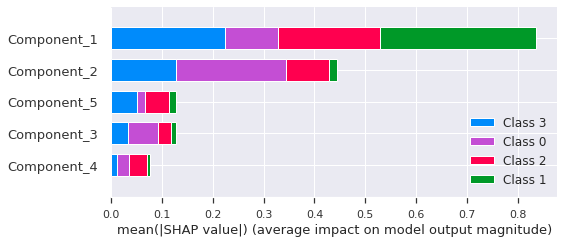

In [270]:
interpret_model(tuned_rf_pca, plot='summary')

**Visualize a single prediction**

In [273]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

From the above the plot, we can see the "base value," which is defined as the mean predicted target; and f(x), which is the prediction for a selected observation (i.e. observation number 32). The red-colored features increased the predicted value, while the blue-colored features decreased it. The size of each feature (i.e. Principal Component) indicates the impact it has on the model.

**Visualize many predictions**

In [274]:
interpret_model(tuned_rf_pca, plot='reason')